In [5]:
import numpy as np
import pandas as pd
import tensorflow as tf
import os

In [3]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.preprocessing.image import load_img

In [35]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, array_to_img
from keras.preprocessing import image
import matplotlib.pyplot as plt

In [43]:
dataset = "D:\data set\minion"
output_path = "D:\data set\modi_minion"

In [44]:
os.makedirs(output_path, exist_ok=True)

# List all image files in the input directory
image_files = [f for f in os.listdir(dataset) if os.path.isfile(os.path.join(dataset, f))]

datagen = image.ImageDataGenerator(zoom_range=[0.5, 1.0])

for image_file in image_files:
    try:
        img = image.load_img(os.path.join(dataset, image_file), target_size=(244, 244))
        img_array = img_to_array(img)
        img_array = img_array.reshape((1,) + img_array.shape)

        # Apply rotation
        rotated_img = image.random_rotation(img_array[0], rg=30, row_axis=0, col_axis=1, channel_axis=2, fill_mode='nearest')
        image.save_img(os.path.join(output_path, f'rotated_{image_file}'), array_to_img(rotated_img))

        # Apply shifting
        shifted_img = image.random_shift(img_array[0], wrg=0.2, hrg=0.2, row_axis=0, col_axis=1, channel_axis=2, fill_mode='nearest')
        image.save_img(os.path.join(output_path, f'shifted_{image_file}'), array_to_img(shifted_img))

        # Apply flipping
        flipped_img = np.fliplr(img_array[0])
        image.save_img(os.path.join(output_path, f'flipped_{image_file}'), array_to_img(flipped_img))

        # Apply brightness adjustment
        brightness_img = image.random_brightness(img_array[0], brightness_range=[0.4, 1.5])
        image.save_img(os.path.join(output_path, f'bright_{image_file}'), array_to_img(brightness_img))
        
        # Apply Zoom
        zoomed_img = datagen.random_transform(img_array[0])
        image.save_img(os.path.join(output_path, f'zoomed_{image_file}'), array_to_img(zoomed_img))

    except Exception as e:
        print(f"Error processing {image_file}: {e}")

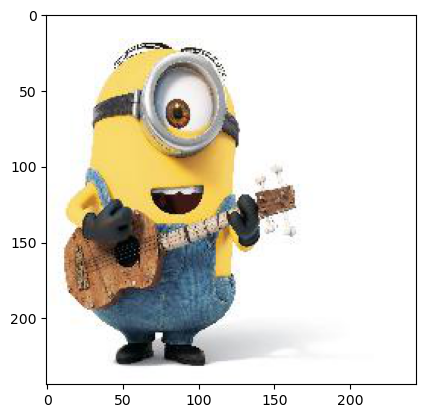

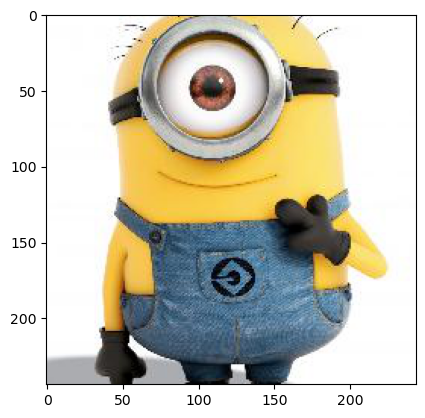

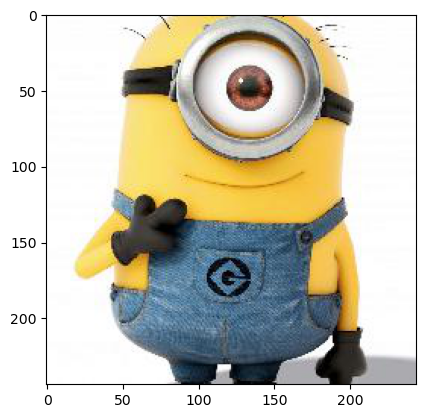

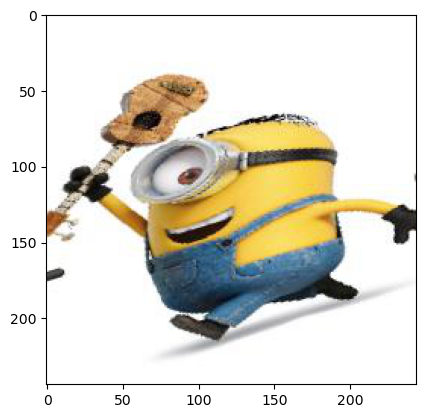

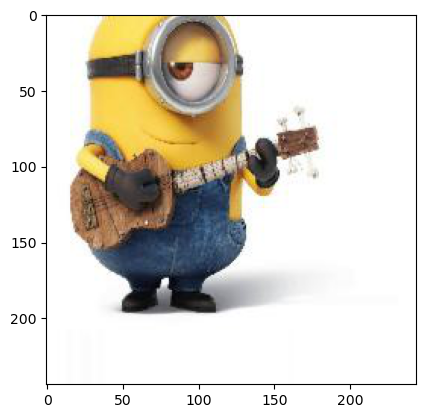

...

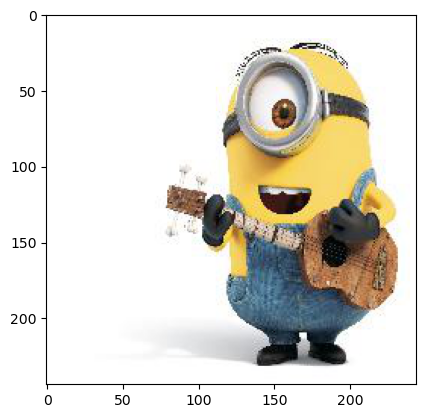

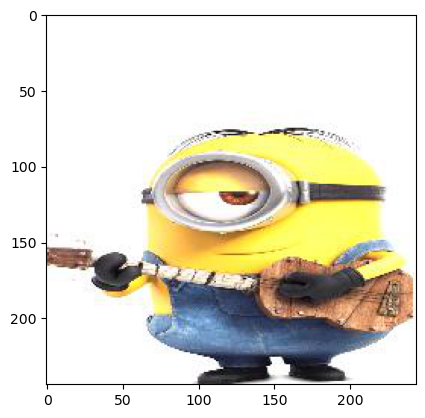

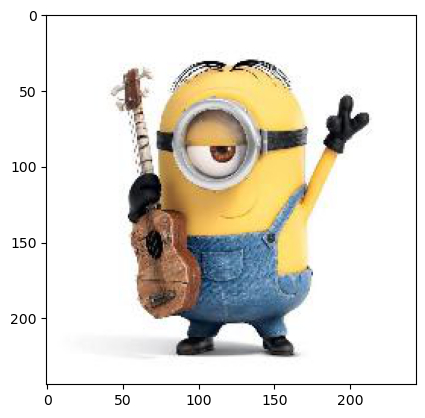

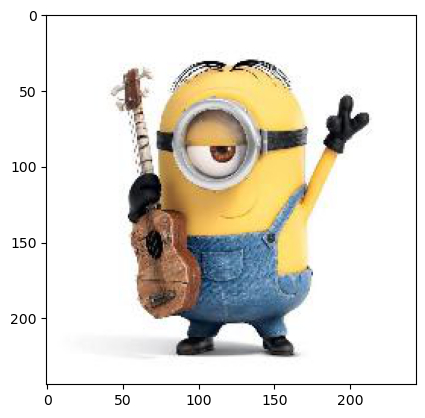

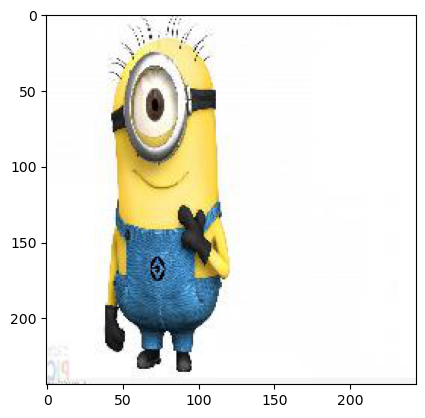

In [47]:
augmented_images = os.listdir(output_path)

random_indices = np.random.choice(len(augmented_images), 55, replace=True)

for i in random_indices:
  image_path = os.path.join(output_path, augmented_images[i])
  image = load_img(image_path)
  plt.imshow(image)
  plt.show()